# Загружаем данные

In [5]:
# загружаем бибилиотеки 
from pandas import Series
import pandas as pd
import numpy as np
import pandas_profiling
from datetime import datetime
import pandas_profiling
from itertools import combinations
from scipy.stats import ttest_ind
import statsmodels.api as sm
import scipy.stats as sst

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import confusion_matrix
from sklearn.metrics import auc, roc_auc_score, roc_curve, log_loss

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score

import warnings
warnings.filterwarnings("ignore")

In [6]:
# зафиксируем константы для воспроизводимости экспериментов
RANDOM_SEED = 42
!pip freeze > requirements.txt
CURRENT_DATE = datetime.now()

In [7]:
class ModelInspect(): # класс для оценки метрик модели
    def __init__(self, model, X_test, y_test):
        self.X_test = X_test
        self.y_test = y_test
        self.y_pred = model.predict(X_test)
        self.probs = model.predict_proba(X_test)[:,1]
    
    def roc_curve_plot(self):
        fpr, tpr, threshold = roc_curve(self.y_test, self.probs)
        roc_auc = roc_auc_score(self.y_test, self.probs)

        plt.figure()
        plt.plot([0, 1], label='Baseline', linestyle='--')
        plt.plot(fpr, tpr, label = 'Regression')
        plt.title('Logistic Regression ROC AUC = %0.10f' % roc_auc)
        plt.ylabel('True Positive Rate')
        plt.xlabel('False Positive Rate')
        plt.legend(loc = 'lower right')
        plt.show()
    
    def confusion_matrix_plot(self):
        tn, fp, fn, tp = confusion_matrix(self.y_test, self.y_pred).ravel()
        cf_matrix = np.array([[tp,fp],[fn,tn]])
        group_names = ['TP','FP','FN','TN']
        group_counts = ['{0:0.0f}'.format(value) for value in cf_matrix.flatten()]
        labels = [f"{v1}\n{v2}" for v1, v2 in zip(group_names,group_counts)]
        labels = np.asarray(labels).reshape(2,2)
        plt.figure()
        sns.heatmap(cf_matrix, annot=labels, annot_kws={"size": 20}, fmt='', cmap= 'Pastel1', cbar = False, \
                 xticklabels = ['Дефолт','Не дефолт'], yticklabels= ['Дефолт','Не дефолт'])
        plt.title('Матрица ошибок для default')
        plt.show()
        
    def get_metrics(self):
        result = pd.Series({
            'accuracy' : accuracy_score(self.y_test, self.y_pred),
            'logloss' : log_loss(self.y_test, self.y_pred),
            'precision' : precision_score(self.y_test, self.y_pred),
            'recall' : recall_score(self.y_test, self.y_pred),
            'F1' : f1_score(self.y_test, self.y_pred),
            'ROC_AUC': roc_auc_score(self.y_test, self.probs) 
        })
        return result
    
    def recall_precision_plot(self):
        precisions, recalls, _ = precision_recall_curve(self.y_test, self.y_pred)
        ap = average_precision_score(self.y_test, self.y_pred)        
        
        plt.figure()
        
        plt.step(recalls, precisions, color='b', alpha=0.2, where='post')
        plt.fill_between(recalls, precisions, step='post', alpha=0.2, color='lime')
        plt.xlabel('Recall');
        plt.ylabel('Precision');
        plt.title('Recall-precision curve, площадь под кривой = %0.10f' % ap)
        plt.grid(True)

        plt.show()
                           

In [8]:
# импортируем данные
data_directory = '/work/data_kaggle/'
train = pd.read_csv(data_directory+'train.csv')
test= pd.read_csv(data_directory+'test.csv')
sample_submission = pd.read_csv(data_directory+'/sample_submission.csv')

In [9]:
# для корректной обработки признаков объединяем трейн и тест в один датасет
train['Train'] = 1 # помечаем где у нас трейн
test['Train'] = 0 # помечаем где у нас тест

data = train.append(test, sort=False).reset_index(drop=True) # объединяем

# Цели и задачи проекта

О чем проект?

На основании предоставленных данных найти вероятность, 
с которой клиент отдаст кредит банку. Это задача бинарной классификации, поэтому будем
брать за основу логистическую регрессию.

Что хочется попробовать?
+ добавить новые признаки и посмотреть, как они влияют на модель
+ попробовать два вида регуляризации
+ построить другие модели (catBoost, xgBoost)
+ пощупать гиперпараметры
+ разобраться с оценкой значимости
+ найти и применить как можно больше интересных метрик
+ по максимуму все обернуть в функции и классы
+ найти решение для того, чтобы EDA не занимало большую часть времени и проекта
+ убрать выбросы и проверить качество
+ убрать не значимые признаки и проверить качество
+ избавиться от дисбаланса классов и посмотреть на улучшение
+ добавить в model_selection - kFold, StratifiedKFold
+ попробовать работать в команде - откликнулась только Екатерина Козлова, но у нее
дедлайн на неделю раньше и у меня не получилось быстро въехать в проект, чтобы вместе 
сдать. Для себя вынесла, что надо заранее обговаривать,
в какой среде делаем проект, что для каждого значит работа в команде, какие задачи, 
кто берет на себя. 
+ протестировать AWS Glue DataBrew от Amazon для предварительной обработке данной

Какие появлялись вопросы в ходе работы?
+ зависаю, когда пытаюсь осознать, что происходит, когда мы пытаемся подобрать наилучший 
параметр. Те с какого момента надо подгружать все функции, по которым мы обрабатываем
файл. И как вообще строить весь поток работы - что применять, в каком порядке, в
каком виде это уйдет в работу. Я понимаю, что нужна практика, но иногда прям торможу 
и не понимаю за что хвататься. Как решаю - читаю про введение в мл от A.Myuller и S.Gvido.
+ плохо программирую. Как решаю - начала проходить задания на питонтьютор.
+ плохо визуализирую и оцениваю эти визуализации. Как решаю - очень
понравился бесплатный курс от tableau (например, вот про боксплоты
https://tableau.pro/m20) - читаю, делаю задания.

Что было сделано?

1. Все данные были загружены, объединены в один датасет
2. Посмотрела на test и train отдельно с помощью pandas_profiling, поискала 
ошибки, пропуски 
3. Обработала данные 
4. Подготовила данные для машинного обучения
5. Сделала наивную модель с помощью логиситической регрессии
6. Увеличивала предсказательную способность модели

# Предварительный анализ данных 

In [ ]:
# смотрим описательные статистики
data.describe()

,client_id,age,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,default,Train
count,110148.000000,110148.000000,110148.000000,110148.000000,110148.000000,110148.000000,110148.000000,110148.000000,110148.000000,110148.000000,110148.000000,110148.000000,73799.000000,110148.000000
mean,55074.500000,39.249410,0.273205,0.165514,-1.904535,2.005002,56.751189,1.574945,2.497867,41012.648537,1.731588,2.765570,0.126994,0.669999
std,31797.133063,11.518063,0.799099,0.371645,0.499397,2.266926,13.065923,0.527562,0.687651,45399.735051,1.122652,1.010151,0.332968,0.470215
min,1.000000,21.000000,0.000000,0.000000,-3.624586,0.000000,20.000000,1.000000,1.000000,1000.000000,1.000000,1.000000,0.000000,0.000000
25%,27537.750000,30.000000,0.000000,0.000000,-2.260434,0.000000,50.000000,1.000000,2.000000,20000.000000,1.000000,2.000000,0.000000,0.000000
50%,55074.500000,37.000000,0.000000,0.000000,-1.920823,1.000000,50.000000,2.000000,3.000000,30000.000000,1.000000,3.000000,0.000000,1.000000
75%,82611.250000,48.000000,0.000000,0.000000,-1.567888,3.000000,60.000000,2.000000,3.000000,48000.000000,2.000000,4.000000,0.000000,1.000000
max,110148.000000,72.000000,33.000000,1.000000,0.199773,53.000000,80.000000,3.000000,3.000000,1000000.000000,4.000000,4.000000,1.000000,1.000000


In [ ]:
# визуально проверяем данные
data.sample(3)

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default,Train
31670,14161,21JAN2014,UGR,F,25,N,N,0,0,-1.465652,2,40,1,2,15000,1,3,N,0.0,1
79672,1420,05JAN2014,SCH,M,28,N,N,2,0,-1.382992,1,60,1,2,40000,1,4,Y,NaN,0
88590,106462,25APR2014,GRD,F,51,Y,N,0,0,-2.270281,0,60,1,1,41000,1,2,N,NaN,0


In [ ]:
# первые две строчки
data.head(2)

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default,Train
0,25905,01FEB2014,SCH,M,62,Y,Y,0,0,-2.008753,1,50,1,2,18000,4,1,N,0.0,1
1,63161,12MAR2014,SCH,F,59,N,N,0,0,-1.532276,3,50,2,3,19000,4,1,N,0.0,1


In [ ]:
# последние две строчки
data.tail(2)

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default,Train
110146,1971,07JAN2014,UGR,F,27,N,N,1,0,-1.242392,2,80,2,3,30000,1,1,N,NaN,0
110147,69044,17MAR2014,SCH,M,38,N,N,0,0,-1.507549,2,50,1,2,15000,4,2,N,NaN,0


In [ ]:
# посмотрим есть ли пропуски, колонки и тип данных
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110148 entries, 0 to 110147
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   client_id         110148 non-null  int64  
 1   app_date          110148 non-null  object 
 2   education         109670 non-null  object 
 3   sex               110148 non-null  object 
 4   age               110148 non-null  int64  
 5   car               110148 non-null  object 
 6   car_type          110148 non-null  object 
 7   decline_app_cnt   110148 non-null  int64  
 8   good_work         110148 non-null  int64  
 9   score_bki         110148 non-null  float64
 10  bki_request_cnt   110148 non-null  int64  
 11  region_rating     110148 non-null  int64  
 12  home_address      110148 non-null  int64  
 13  work_address      110148 non-null  int64  
 14  income            110148 non-null  int64  
 15  sna               110148 non-null  int64  
 16  first_time        11

Описания полей датасета

- client_id - идентификатор клиента
- education - уровень образования - нужно заполнить пропуски
- sex - пол заемщика
- age - возраст заемщика
- car - флаг наличия автомобиля
- car_type - флаг автомобиля иномарки
- decline_app_cnt - количество отказанных прошлых заявок
- good_work - флаг наличия “хорошей” работы
- bki_request_cnt - количество запросов в БКИ
- home_address - категоризатор домашнего адреса
- work_address - категоризатор рабочего адреса
- income - доход заемщика
- foreign_passport - наличие загранпаспорта
- sna - связь заемщика с клиентами банка
- first_time - давность наличия информации о заемщике
- score_bki - скоринговый балл по данным из БКИ
- region_rating - рейтинг региона
- app_date - дата подачи заявки - необходимо преобразовать
- default - флаг дефолта по кредиту

## EDA

Посмотрим отдельно на файл test и train - может заметим дисбаланс в разделении 

In [ ]:
# сгенерируем отчет с показателями EDA для тестовой и обучающей выборки
pandas_profiling.ProfileReport(test)

Summarize dataset:   0%|          | 0/32 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
pandas_profiling.ProfileReport(train)

Summarize dataset:   0%|          | 0/33 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Выводы и предположения
Датасет в хорошем состоянии. Пропуски есть только в столбце Education, а также в default
у тестовой выборки.

Визуально просмотрев отчет для test и train, можно сказать, что датасеты разделены
корректно и нет перекосов по классам, распределение переменных одинаковое. 
Поэтому посмотрим подробнее на переменные в train и попробуем предположить какие
могут быть зависимости с целевой переменной.

- Есть ли в client_id какая-либо информация кроме номера клиента? По графику можно
заметить, что нумерация сквозная в зависимости от дня обращения.
- Есть ли связь между днем недели и дефолтом? Можно поробовать перевести даты в
дни недели и помсотреть есть ли связь.
- Можем предположить, что чем ниже уровень образования, тем выше риск дефолта.
- Большинство кредитов приходится на заемщиков в возрасте от 27 до 35 лет. Интересно
посмотреть на дефолт у заемщиков в возрасте от 21 до 26 лет и от 35 до 72 лет.
- Только у трети заемщиков есть машина, у каждого второго - иномарка. Отдают ли клиенты
с иномарками кредит чаще? И насколько нужен столбец car_type?
- В переменной decline_app_cnt можем заметить большой разброс. У большинства клиентов
(около 80%) не было заявок, в которых банк отказал, или их было одна или две.
Но есть и такие кому банк отказал больше 16 раз. Можно посмотреть насколько сильно данная
переменная влияет и стоит ли убирать значения, например, больше двух или которые выходят
за 1,5IQR.
- У 80% заемщиков нет флага о том, что у них хорошая работа. Насколько нужен будет
этот столбец в дальнейшем?
- Количество запросов в bki можно будет прологорифмировать и посмотреть на изменения.
- Для столбцов region_rating, home_address, work_address, sna, first_time будет 
интересно построить боксплоты или сводные таблицы, чтобы посмотреть на их связь с
целевой переменной.

По корреляции Пирсона видим высокую корреляцию между home_address и work_address, и 
отрицательную корреляцию sna и first_time.
По Спирману можно также увидеть связь между столбцами income и region_rating.

Просматривая отчет не были замечены ошибки заполнения и выбросы, связанные
с такими ошибками. Но можно заметить, что у некоторых признаков распределение смещенно 
(bki_request_cnt, income, region_rating, decline_app_cnt) или 
присутствуют значения, которые визуально можно трактовать, как 
выбросы (sna - параметр 3 - может его объединить со 2 или удалить?, home_address - 
значение 3).

Что с этим можно попробовать сделать?
- оставить как есть
- прологорифмировать и посмотреть как изменилось количество выбросов
- удалить то, что кажется выбросами и посмотреть на метрики
- проверить как логистическая регрессия работает с выбросами и смещенным распределением,
поискать другие модели.

Также можно попробовать сделать понижающий отбор - попробовать, например, сравнять 
количество клиентов с дефолтом и без. Или обратить внимание на алгоритмы для
несбалансированных данных.

# Подготовка данных

### Обработка education

<AxesSubplot:>

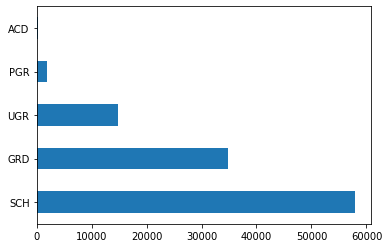

In [ ]:
# смотрим на распределение 
data['education'].value_counts().plot.barh()

In [ ]:
mode = data.education.mode()[0]
print('Самое частое значение в поле Education: ', mode)

Самое частое значение в поле Education:  SCH


In [ ]:
# Заполним пропуски в education модой
data['education'].fillna(mode, inplace=True)
data.education.unique()

array(['SCH', 'GRD', 'UGR', 'PGR', 'ACD'], dtype=object)

### Обработка app_date

In [ ]:
# преобразуем в datetime
data['app_date'] = pd.to_datetime(data.app_date, format='%d%b%Y')
data['app_date'].sample(5)

106307   2014-02-05
12664    2014-02-14
49054    2014-02-23
2325     2014-01-21
85557    2014-03-15
Name: app_date, dtype: datetime64[ns]

In [ ]:
# Выясняем начало и конец периода нашего датасета - это 1 января и 30 апреля 2014 года
start = data.app_date.min()
end = data.app_date.max()
start,end

(Timestamp('2014-01-01 00:00:00'), Timestamp('2014-04-30 00:00:00'))

In [ ]:
# Вводим новый признак - номер дня с 1 января 2014 года
data["days"] = (data.app_date - start).dt.days.astype("int")

# Месяц подачи заявки
data["app_date_month"] = data.app_date.dt.month

# День недели, в который была подана заявка
data["app_date_weekday"] = data.app_date.dt.weekday

<AxesSubplot:>

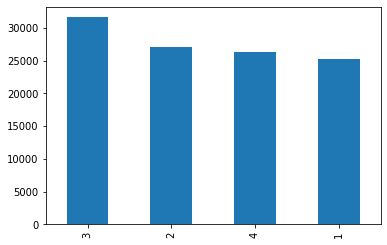

In [ ]:
# проверяем распределение заявок по месяцам
data['app_date'].dt.month.value_counts().plot.bar()

# все заявки распределены примерно равномерно

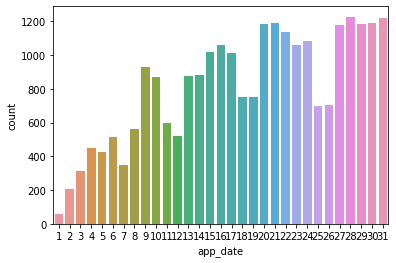

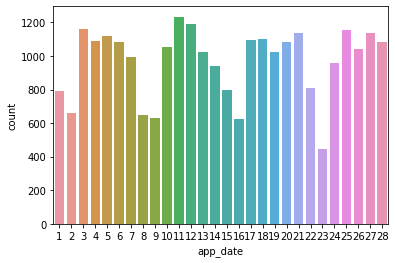

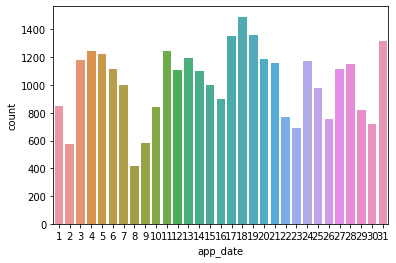

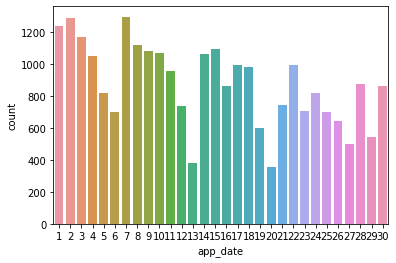

In [ ]:
data['month'] = data['app_date'].dt.month
for i in [1,2,3,4]:
    plt.figure()
    sns.countplot(x=data[data.month == i]['app_date'].dt.day, data=data[data.month == i])
    plt.show()

Визуально создается впечатление, что количество заявок распределяется по линии похожей
на синусоиду. Построим новый признак - количество заявок в дне. 

In [ ]:
# и еще один признак: количество заявок в данном дне
dates = data.app_date.value_counts()
data['app_cnt'] = data.app_date.apply(lambda x: dates[x])
data['app_cnt'].sample(5)

56541     981
91920    1226
11047     768
86781    1071
8368      600
Name: app_cnt, dtype: int64

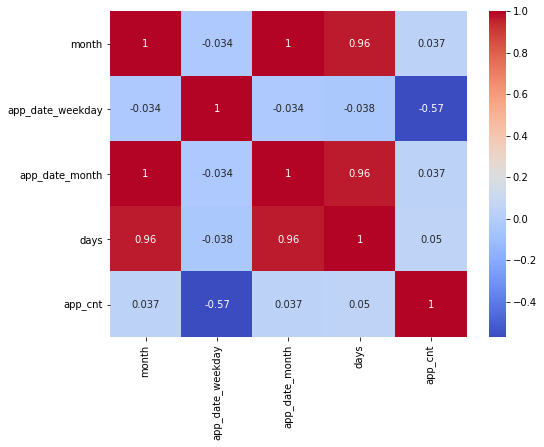

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
ax = sns.heatmap(
    data.loc[:, ["month", "app_date_weekday", "app_date_month", "days", 'app_cnt']].corr(),
    annot=True,
    cmap="coolwarm",
)


Видим высокую корреляцию у month, app_date_month и days.
Оставляем app_date_weekday, days, app_cnt.

In [ ]:
# Удалим из датасета признаки с высококй корреляцией 
data.drop(['app_date_month', 'month'],  axis = 1, inplace = True)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110148 entries, 0 to 110147
Data columns (total 23 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   client_id         110148 non-null  int64         
 1   app_date          110148 non-null  datetime64[ns]
 2   education         110148 non-null  object        
 3   sex               110148 non-null  object        
 4   age               110148 non-null  int64         
 5   car               110148 non-null  object        
 6   car_type          110148 non-null  object        
 7   decline_app_cnt   110148 non-null  int64         
 8   good_work         110148 non-null  int64         
 9   score_bki         110148 non-null  float64       
 10  bki_request_cnt   110148 non-null  int64         
 11  region_rating     110148 non-null  int64         
 12  home_address      110148 non-null  int64         
 13  work_address      110148 non-null  int64         
 14  inco

### client_id

In [ ]:
# Посмотрим на признак client_id
data.client_id.astype('object').describe(include = 'object')

count     110148
unique    110148
top            1
freq           1
Name: client_id, dtype: int64

In [ ]:
data.drop(['client_id'], axis = 1, inplace = True)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110148 entries, 0 to 110147
Data columns (total 22 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   app_date          110148 non-null  datetime64[ns]
 1   education         110148 non-null  object        
 2   sex               110148 non-null  object        
 3   age               110148 non-null  int64         
 4   car               110148 non-null  object        
 5   car_type          110148 non-null  object        
 6   decline_app_cnt   110148 non-null  int64         
 7   good_work         110148 non-null  int64         
 8   score_bki         110148 non-null  float64       
 9   bki_request_cnt   110148 non-null  int64         
 10  region_rating     110148 non-null  int64         
 11  home_address      110148 non-null  int64         
 12  work_address      110148 non-null  int64         
 13  income            110148 non-null  int64         
 14  sna 

### Делим на группы

In [ ]:
data.nunique().sort_values(ascending= False)

score_bki           102618
income                1207
app_date               120
days                   120
app_cnt                113
age                     52
bki_request_cnt         40
decline_app_cnt         24
app_date_weekday         7
region_rating            7
education                5
first_time               4
sna                      4
home_address             3
work_address             3
car                      2
foreign_passport         2
default                  2
Train                    2
sex                      2
good_work                2
car_type                 2
dtype: int64

In [ ]:
# числовые признаки
num_cols = [
    "score_bki",
    "income",
    "age",
    "days",
    "bki_request_cnt",
    "decline_app_cnt",
    'app_cnt'
]
# бинарные признаки
bin_cols = ["sex", "good_work", "car", "car_type", "foreign_passport"]
# категориальные признаки
cat_cols = [
    "education",
    "sna",
    "first_time",
    "app_date_weekday",
    "work_address",
    "home_address",
    "region_rating"
]


Пока отнесла region_rating в категориальные признаки. 

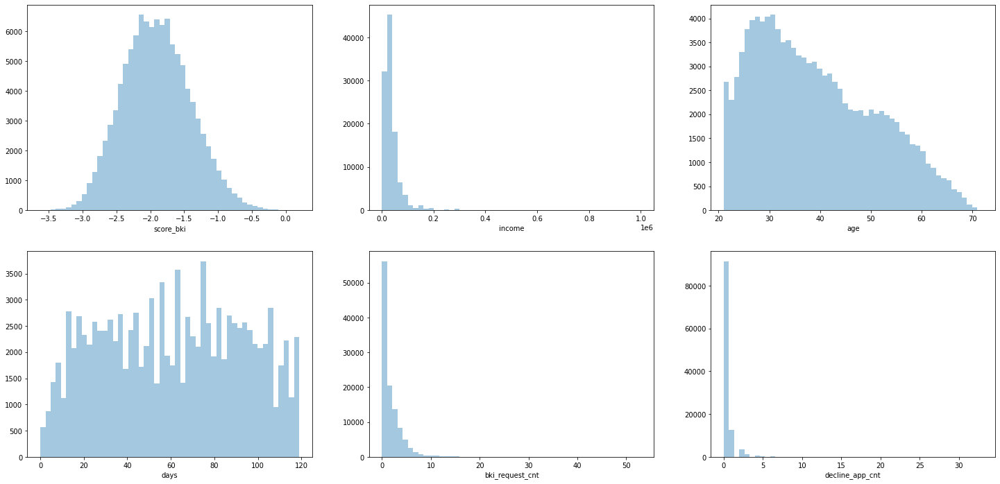

In [ ]:
# посмотрим на распределение числовых признаков
fig, axes = plt.subplots(2, 3, figsize=(25,12))
for col, i in zip(num_cols, range(6)):
    sns.distplot(data[col], kde=False, ax=axes.flat[i])

In [ ]:
Видим, что у некоторых признаков распределение смещено - попробуем логарифмировать.

IndexError: index 6 is out of bounds for axis 0 with size 6

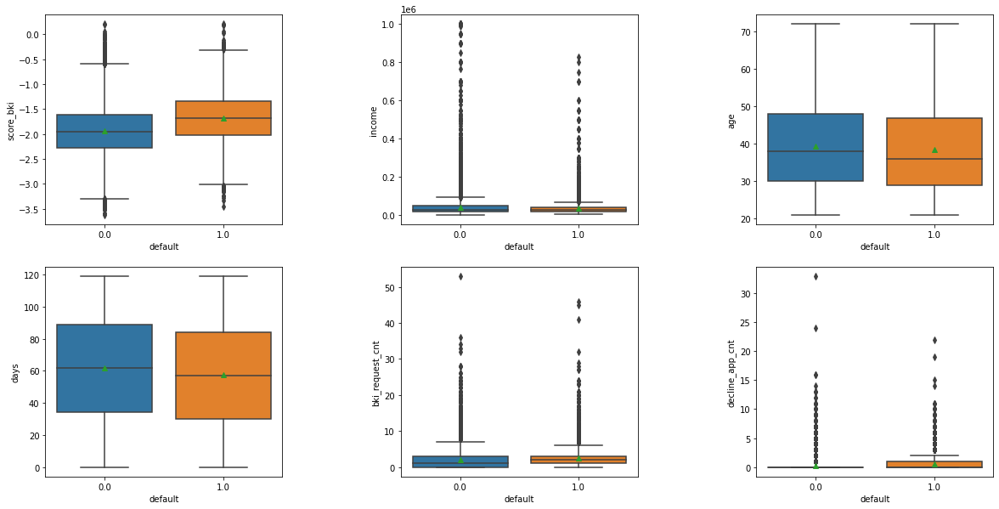

In [ ]:
# построим боксплоты для числовых признаков и целевой переменной - поищем выбросы
fig, axes = plt.subplots(2, 3, figsize=(20, 10))
plt.subplots_adjust(wspace=0.5)
axes = axes.flatten()
for i in range(len(num_cols)):
    sns.boxplot(
        x="default",
        y=num_cols[i],
        data=data,
        orient="v",
        ax=axes[i],
        showfliers=True,
        showmeans=True,
    )

Видим, что данные распределены не равномерно - много точек, которые выходят за
макисмальное значение. Можно будет их удалить, в начале посмотрим как будет работать 
модель с ними.

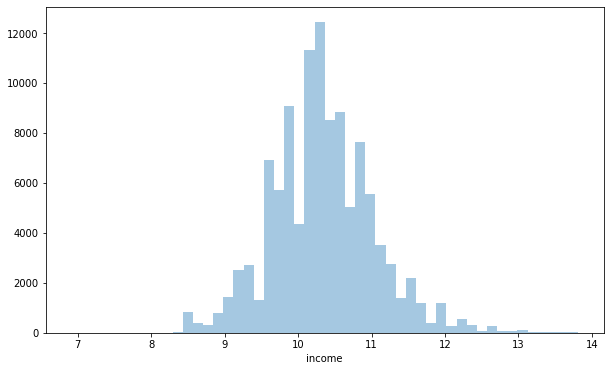

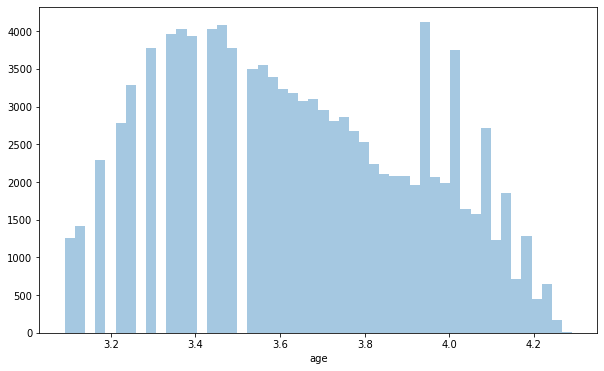

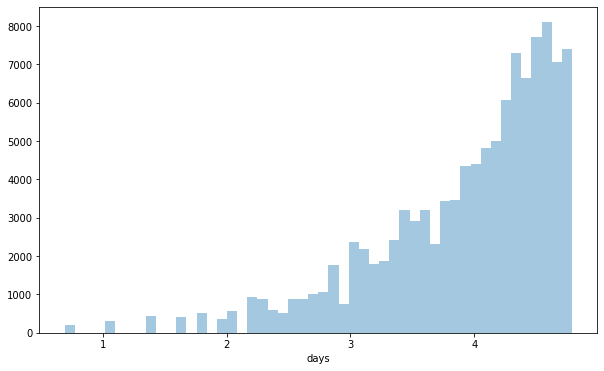

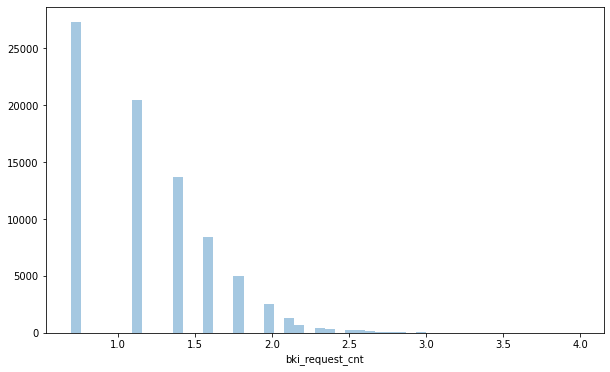

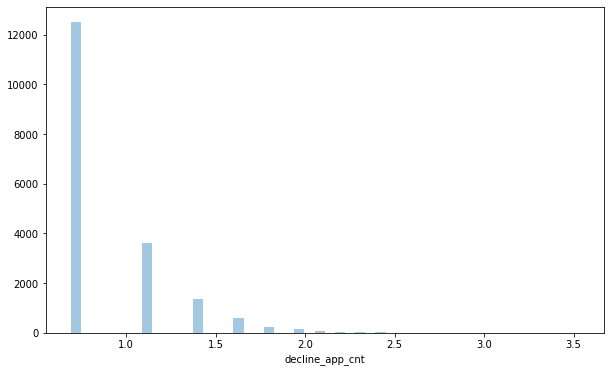

In [ ]:
# логорифмируем
log_num_cols = [
    "income",
    "age",
    "days",
    "bki_request_cnt",
    "decline_app_cnt"
]
for i in log_num_cols:
    data[i] = np.log(data[i] + 1)
    plt.figure( figsize=(10,6))
    sns.distplot(data[i][data[i] > 0].dropna(), kde = False, rug=False)
    plt.show()

<AxesSubplot:>

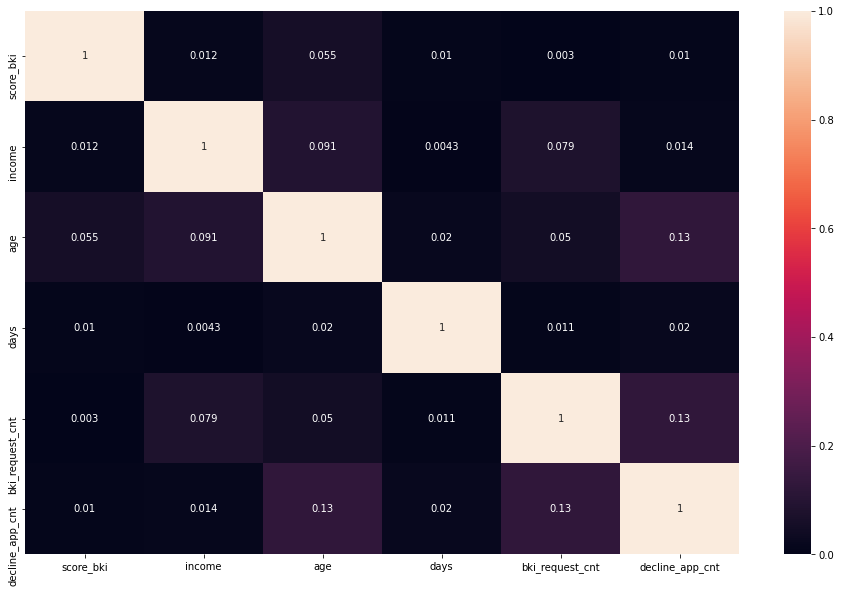

In [ ]:
# посмотрим на корреляцию
plt.figure(figsize=(16,10))
sns.heatmap(data[num_cols].corr().abs(), vmin=0, vmax=1, annot=True)

Видим высокую корреляцию между score_bki и decline_app_cnt, days.

### Преобразование бинарных и категориальных переменных

In [ ]:
# Преобразуем education в целочисленный формат
label_encoder = LabelEncoder()
data['education'] = label_encoder.fit_transform(data['education'])
data.education.unique()

array([3, 1, 4, 2, 0])

In [ ]:
# Закодируем region_rating
label_encoder = LabelEncoder()
data['region_rating'] = label_encoder.fit_transform(data['region_rating'])
data.region_rating.unique()

array([3, 6, 4, 2, 5, 0, 1])

In [ ]:
# Преобразуем биноминальные признаки
label_encoder = LabelEncoder()
for col in bin_cols:
    data[col] = label_encoder.fit_transform(data[col])
    
# убедимся в преобразовании    
data.head(5)

,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,...,work_address,income,sna,first_time,foreign_passport,default,Train,days,app_date_weekday,app_cnt
0,2014-02-01,3,1,4.143135,1,1,0.000000,0,-2.008753,0.693147,...,2,9.798183,4,1,0,0.0,1,3.465736,5,794
1,2014-03-12,3,0,4.094345,0,0,0.000000,0,-1.532276,1.386294,...,3,9.852247,4,1,0,0.0,1,4.262680,2,1110
2,2014-02-01,3,1,3.258097,1,0,1.098612,0,-1.408142,0.693147,...,2,10.308986,1,4,1,0.0,1,3.465736,5,794
3,2014-01-23,3,0,3.988984,0,0,0.000000,0,-2.057471,1.098612,...,3,9.210440,1,3,0,0.0,1,3.135494,3,1060
4,2014-04-18,1,1,3.891820,0,0,0.000000,1,-1.244723,0.693147,...,3,10.308986,1,4,1,0.0,1,4.682131,4,981


In [ ]:
# проверим
for column in bin_cols:
    print('Уникальные значения в поле {0} : {1}'.format(column,data[column].unique()))

Уникальные значения в поле sex : [1 0]
Уникальные значения в поле good_work : [0 1]
Уникальные значения в поле car : [1 0]
Уникальные значения в поле car_type : [1 0]
Уникальные значения в поле foreign_passport : [0 1]


### Значимость переменных

Значимость непрерывных переменных (на основе однофакторного дисперсионного анализа (ANOVA)) Для оценки значимости числовых переменных будем использовать функцию f_classif из библиотеки sklearn.

В качестве меры значимости мы будем использовать значение f -статистики. Чем значение статистики выше, тем меньше вероятность того, что средние значения не отличаются, и тем важнее данный признак для нашей линейной модели.

<AxesSubplot:>

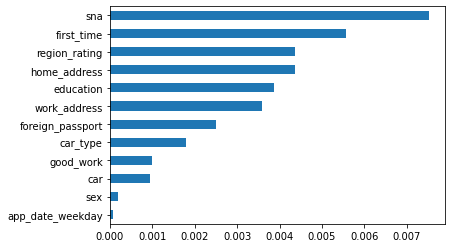

In [ ]:
imp_cat = pd.Series(mutual_info_classif(data[data.Train == 1][bin_cols + cat_cols], data[data.Train == 1]['default'], 
                                     discrete_features =True), index = bin_cols + cat_cols)
imp_cat.sort_values(inplace = True)
imp_cat.plot(kind = 'barh')

+ cамый значимый признак - sna
+ наименее значимый признак - app_date_weekday

<AxesSubplot:>

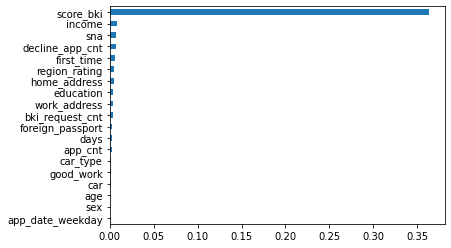

In [ ]:
# посмотрим на значимость всех признаков
imp_cat = pd.Series(
    mutual_info_classif(
        data[data.Train == 1][cat_cols + bin_cols + num_cols],
        data[data.Train == 1]["default"],
        discrete_features=True,
    ),
    index=cat_cols + bin_cols + num_cols,
)
imp_cat.sort_values(inplace=True)
imp_cat.plot(kind="barh")


Самые значимые признаки: score_bki, income.
Наимение значимые: age и sex, app_date_weekday.

In [ ]:
import plotly.express as px

fig = px.scatter_3d(data[data.Train == 1], x='score_bki', y='income', z='sna', color='default')
fig.show()

Так как основная идея линейного классификатора заключается в том, что признаковое 
пространство может быть разделено гиперплоскостью на два полупространства, 
в каждом из которых прогнозируется одно из двух значений целевого класса. 
При таком распределении не получится найти адекватную разделяющую поверхность.
Поэтому качество предсказания логистической регрессии будет не очень высокое.

In [ ]:
# закодируем категориальные признаки при помощи get_dummy
data_cat = pd.get_dummies(data.loc[:, cat_cols], columns = cat_cols)
data_cat.sample(3)

,education_0,education_1,education_2,education_3,education_4,sna_1,sna_2,sna_3,sna_4,first_time_1,...,home_address_1,home_address_2,home_address_3,region_rating_0,region_rating_1,region_rating_2,region_rating_3,region_rating_4,region_rating_5,region_rating_6
47323,0,0,0,1,0,1,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
24451,0,0,0,1,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,1
50438,0,0,0,0,1,0,0,1,0,0,...,1,0,0,0,0,0,0,0,1,0


In [ ]:
# стандартизиуем числовые признаки
data_num = pd.DataFrame(StandardScaler().fit_transform(data[num_cols]), columns = num_cols)

In [ ]:
# объединим все признаки в один датасет
X = pd.concat([data_num, data_cat, data[bin_cols], data['Train'], data['default']], axis = 1)
Y = data['default'].values

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110148 entries, 0 to 110147
Data columns (total 47 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   score_bki           110148 non-null  float64
 1   income              110148 non-null  float64
 2   age                 110148 non-null  float64
 3   days                110148 non-null  float64
 4   bki_request_cnt     110148 non-null  float64
 5   decline_app_cnt     110148 non-null  float64
 6   app_cnt             110148 non-null  float64
 7   education_0         110148 non-null  uint8  
 8   education_1         110148 non-null  uint8  
 9   education_2         110148 non-null  uint8  
 10  education_3         110148 non-null  uint8  
 11  education_4         110148 non-null  uint8  
 12  sna_1               110148 non-null  uint8  
 13  sna_2               110148 non-null  uint8  
 14  sna_3               110148 non-null  uint8  
 15  sna_4               110148 non-nul

In [ ]:
print(cat_cols + bin_cols)

['education', 'sna', 'first_time', 'app_date_weekday', 'work_address', 'home_address', 'region_rating', 'sex', 'good_work', 'car', 'car_type', 'foreign_passport']


### Наивная модель

In [ ]:
# разделим данные на тренировочные и тестовые
train_data = X.query('Train == 1').drop(['Train'], axis=1)
test_data = X.query('Train == 0').drop(['Train'], axis=1)

# целевая переменная
y = train_data.default.values            
X = train_data.drop(['default'], axis=1)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_SEED)

In [ ]:
# проверим
print(X.shape, X_train.shape, X_test.shape)

(73799, 45) (59039, 45) (14760, 45)


In [ ]:
# обучим модель
warnings.simplefilter('ignore')

model = LogisticRegression(max_iter = 2000, random_state=RANDOM_SEED)
model.fit(X_train, y_train)

LogisticRegression(max_iter=2000, random_state=42)

In [ ]:
mi_logreg = ModelInspect(model, X_test, y_test)

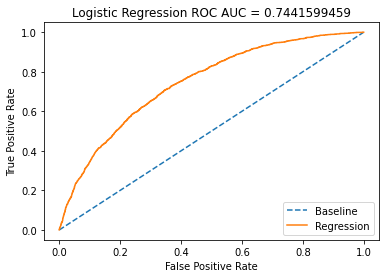

In [ ]:
mi_logreg.roc_curve_plot()

Получилась достаточно высокий результат для метрики ROC AUC. Чем она ближе к верхнему 
левому углу, тем лучше.

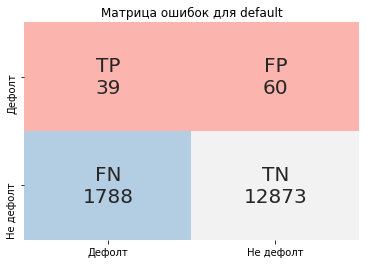

In [ ]:
mi_logreg.confusion_matrix_plot()

На матрице ошибок по главной диагонали 12912 клиентов, при этом ложноотрицательных
1788 (предсказали, что отдадут кредит, а они не отдали), ложноположительных (предсказали,
что не отдадут кредит, а они отдали) - 60

In [ ]:
mi_logreg.get_metrics()

accuracy     0.874797
logloss      4.324370
precision    0.393939
recall       0.021346
F1           0.040498
ROC_AUC      0.744160
dtype: float64

ROC_AUC и accuracy (доля объектов, которые алгоритм отнес к верному классу.)
достаточно высокие, но F1 - низкий, что говорит о том, что модель
совершает ошибку второго рода - слишком много клиентов оказывается в ложноотрицательных.

### Улучшаем показатель ROC AUC

#### Общая функция для подготовки данных

Изначально стандартизацию числовых признаков делала внутри функции. Затем вынесла
после деления датасета - ROC-AUC стал выше на 0.02, 
в матрице ошибок увеличилось количество на главное диагонали - на два клиента. Также 
это сделано с целью избежать утечки данных.

In [46]:
# попробуем переместить scaler для устранения даталиков


warnings.simplefilter("ignore")

# собираем функцию для подготовки данных
def prepare_data_for_ml():
    data_directory = '/work/data_kaggle/'
    train = pd.read_csv(data_directory+'train.csv')
    test = pd.read_csv(data_directory+'test.csv')

    # для корректной обработки признаков объединяем трейн и тест в один датасет
    train['Train'] = 1 # помечаем где у нас трейн
    test['Train'] = 0 # помечаем где у нас тест

    # объединяем
    data = train.append(test, sort=False).reset_index(drop=True)

    # заменяем пропуски в education
    mode = data.education.mode()[0]
    data['education'].fillna(mode, inplace=True)
    data.education.unique()

    # обработка поля app_date
    data['app_date'] = pd.to_datetime(data.app_date, format='%d%b%Y')
    start = data.app_date.min()
    end = data.app_date.max()
    # Вводим новый признак - номер дня с 1 января 2014 года
    data["days"] = (data.app_date - start).dt.days.astype("int")
    # Месяц подачи заявки
    data["app_date_month"] = data.app_date.dt.month
    # День недели, в который была подана заявка
    data["app_date_weekday"] = data.app_date.dt.weekday

    # еще один признак: количество заявок в данном дне
    dates = data.app_date.value_counts()
    data['app_cnt'] = data.app_date.apply(lambda x: dates[x])

    # Удалим из датасета признаки с высокой корреляцией или без дополнительной инф
    data.drop(['app_date_month', 'client_id'],  axis = 1, inplace = True)

    # числовые признаки
    num_cols = [
        "score_bki",
        "income",
        "age",
        "days",
        "bki_request_cnt",
        "decline_app_cnt",
        'app_cnt'
    ]

    # бинарные признаки
    bin_cols = ["sex", "good_work", "car", "car_type", "foreign_passport"]

    # категориальные признаки
    cat_cols = [
        "education",
        "sna",
        "first_time",
        "app_date_weekday",
        "work_address",
        "home_address",
        "region_rating"
    ]

    # логорифмируем
    log_num_cols = [
        "income",
        "age",
        "days",
        "bki_request_cnt",
        "decline_app_cnt"
    ]

    for i in log_num_cols:
        data[i] = np.log(data[i] + 1)

    # Преобразуем в целочисленный формат
    label_encoder = LabelEncoder()
    data['education'] = label_encoder.fit_transform(data['education'])
    data['region_rating'] = label_encoder.fit_transform(data['region_rating'])

    for col in bin_cols:
        data[col] = label_encoder.fit_transform(data[col])

    # закодируем категориальные признаки при помощи get_dummy
    data_cat = pd.get_dummies(data.loc[:, cat_cols], columns = cat_cols)

    # стандартизиуем числовые признаки
    # data_num = pd.DataFrame(StandardScaler().fit_transform(data[num_cols]), columns = num_cols)

    # объединим все признаки в один датасет
    X = pd.concat([data[num_cols], data_cat, data[bin_cols], data['Train'], data['default']], axis = 1)
    Y = data['default'].values

    # разделим данные на тренировочные и тестовые
    train_data = X.query('Train == 1').drop(['Train'], axis=1)
    test_data = X.query('Train == 0').drop(['Train'], axis=1)

    # целевая переменная
    y = train_data.default.values            
    X = train_data.drop(['default'], axis=1)
 
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_SEED)
    # разделим выборку не тестовую или обучающую
    return X_train, X_test, y_train, y_test, X, y, test_data

def draw_ml_results(model, X_test, y_test):
    mi_logreg_penalty = ModelInspect(model, X_test, y_test)
    mi_logreg_penalty.roc_curve_plot()
    mi_logreg_penalty.confusion_matrix_plot()
    metrics = mi_logreg_penalty.get_metrics()
    print(metrics)

def gen_submission_csv(test_data, model, filename="submission"):
    main_test = pd.read_csv(data_directory+'test.csv')
    X_test = test_data.drop(['default'], axis=1)
    y_pred_prob = model.predict_proba(X_test)[:,1]

    submit = pd.DataFrame(main_test.client_id)
    submit['default']=y_pred_prob
    submit.to_csv(f"{filename}.csv", index=False)

In [18]:
X = pd.concat([data_num, data_cat, data[bin_cols], data['Train'], data['default']], axis = 1)
Y = data['default'].values

train_data = X.query('Train == 1').drop(['Train'], axis=1)
test_data = X.query('Train == 0').drop(['Train'], axis=1)

y = train_data.default.values            # целевая переменная
X = train_data.drop(['default'], axis=1)

NameError: name 'data_num' is not defined

In [20]:
# нормализуем выборку с помощью MinMaxScaler
from sklearn.preprocessing import MinMaxScaler

X_train, X_test, y_train, y_test, *_ = prepare_data_for_ml()

# определим scaler
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

# обучим модель
model = LogisticRegression(
    max_iter=2000, penalty="l1", random_state=RANDOM_SEED, solver="liblinear"
)
model.fit(X_train, y_train)

LogisticRegression(max_iter=2000, penalty='l1', random_state=42,
                   solver='liblinear')

In [25]:
# подготовка для сабмишона
*_, X, y, test_data = prepare_data_for_ml(data_directory)
model = LogisticRegression(
    max_iter=2000, penalty="l1", random_state=RANDOM_SEED, solver="liblinear"
)
model.fit(X, y)

LogisticRegression(max_iter=2000, penalty='l1', random_state=42,
                   solver='liblinear')

In [32]:
submission(test_data, test,'su')

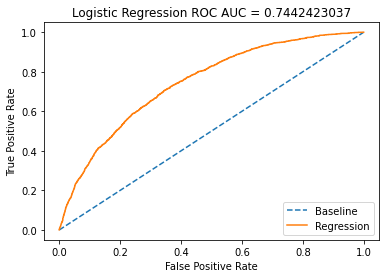

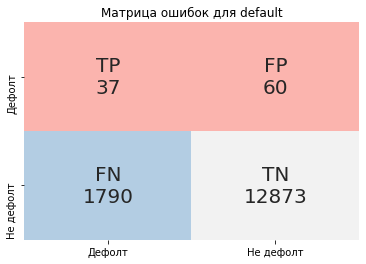

accuracy     0.874661
logloss      4.329050
precision    0.381443
recall       0.020252
F1           0.038462
ROC_AUC      0.744242
dtype: float64


In [ ]:
draw_ml_results(model, X_test, y_test)

Попробуем добавить регуляризацию, solver - saga и liblinear, дали одинаковый результат.
Оставляю liblinear, как наиболее подходящий для небольших датасетов.

In [ ]:
X_train, X_test, y_train, y_test, *_ = prepare_data_for_ml(data_directory)

# обучим модель
model = LogisticRegression(
    max_iter=2000, penalty="l1", random_state=RANDOM_SEED, solver="liblinear"
)
model.fit(X_train, y_train)

LogisticRegression(max_iter=2000, penalty='l1', random_state=42,
                   solver='liblinear')

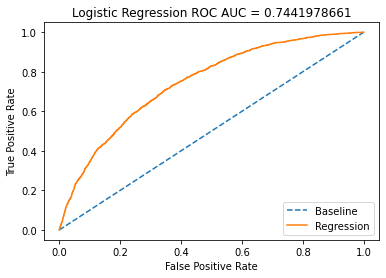

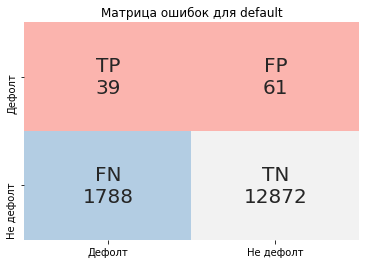

accuracy     0.874729
logloss      4.326710
precision    0.390000
recall       0.021346
F1           0.040477
ROC_AUC      0.744198
dtype: float64


In [ ]:
draw_ml_results(model, X_test, y_test)

In [ ]:
X_test.columns

Index(['score_bki', 'income', 'age', 'days', 'bki_request_cnt',
       'decline_app_cnt', 'app_cnt', 'education_0', 'education_1',
       'education_2', 'education_3', 'education_4', 'sna_1', 'sna_2', 'sna_3',
       'sna_4', 'first_time_1', 'first_time_2', 'first_time_3', 'first_time_4',
       'app_date_weekday_0', 'app_date_weekday_1', 'app_date_weekday_2',
       'app_date_weekday_3', 'app_date_weekday_4', 'app_date_weekday_5',
       'app_date_weekday_6', 'work_address_1', 'work_address_2',
       'work_address_3', 'home_address_1', 'home_address_2', 'home_address_3',
       'region_rating_0', 'region_rating_1', 'region_rating_2',
       'region_rating_3', 'region_rating_4', 'region_rating_5',
       'region_rating_6', 'sex', 'good_work', 'car', 'car_type',
       'foreign_passport'],
      dtype='object')

In [2]:
X_test = test_data.drop(['default'], axis=1)
y_pred_prob = model.predict_proba(X_test)[:,1]

submit = pd.DataFrame(data_test.client_id)
submit['default']=y_pred_prob
submit.to_csv('submission.csv', index=False)

NameError: name 'test_data' is not defined

В результате применения регуляризации l1, получили увеличение метрики F1 (0.040477 против
0.038462). 
Попробуем еще применить параметр для балансировки класса.

In [38]:
# обучим модель c penalty="l1" и class_weight='balanced'
X_train, X_test, y_train, y_test, *_ = prepare_data_for_ml(data_directory)

model = LogisticRegression(
    class_weight='balanced', max_iter=2000, penalty="l1", random_state=RANDOM_SEED, solver="liblinear"
)
model.fit(X_train, y_train)

KeyboardInterrupt: 

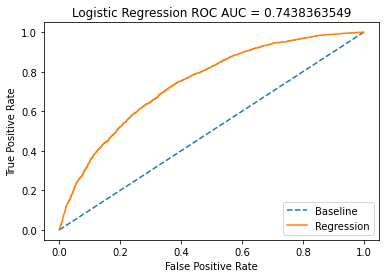

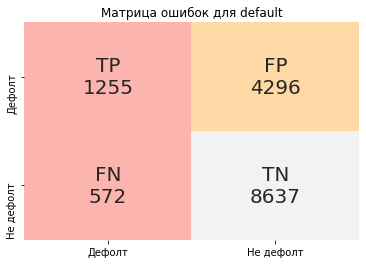

accuracy      0.670190
logloss      11.391477
precision     0.226085
recall        0.686918
F1            0.340201
ROC_AUC       0.743836
dtype: float64


In [ ]:
draw_ml_results(model, X_test, y_test)

Пробовала обучить модель c penalty="l2" и class_weight='balanced', но показатели
ухудшились.

Попробуем подобрать параметры с помощью GridSearchCV

In [43]:
from sklearn.model_selection import GridSearchCV

X_train, X_test, y_train, y_test, *_ = prepare_data_for_ml()

model = LogisticRegression(random_state=RANDOM_SEED)
param_grid = [
    {'penalty': ['l1'], 
     'solver': ['liblinear', 'lbfgs'], 
     'class_weight':['none', 'balanced'], 
     'multi_class': ['auto','ovr']}, 
    {'penalty': ['l2'], 
     'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'], 
     'class_weight':['none', 'balanced'], 
     'multi_class': ['auto','ovr']}, 
    {'penalty': ['none'], 
     'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'], 
     'class_weight':['none', 'balanced'], 
     'multi_class': ['auto','ovr']} 
]
gridsearch = GridSearchCV(model, param_grid, scoring='f1', n_jobs=-1)
gridsearch.fit(X_train, y_train)
model_bestparams = gridsearch.best_estimator_
## печатаем параметры
best_parameters = model.get_params()

KeyboardInterrupt: 

### GridSearchCV

In [47]:
from sklearn.model_selection import GridSearchCV

*_, X, y, test_data = prepare_data_for_ml()

model = LogisticRegression(random_state=RANDOM_SEED)
param_grid = [
    {'penalty': ['l1'], 
     'solver': ['liblinear', 'lbfgs'], 
     'class_weight':['none', 'balanced'], 
     'multi_class': ['auto','ovr']}, 
    {'penalty': ['l2'], 
     'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'], 
     'class_weight':['none', 'balanced'], 
     'multi_class': ['auto','ovr']}, 
    {'penalty': ['none'], 
     'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'], 
     'class_weight':['none', 'balanced'], 
     'multi_class': ['auto','ovr']} 
]
gridsearch = GridSearchCV(model, param_grid, scoring='f1', n_jobs=-1)
gridsearch.fit(X_train, y_train)
model_bestparams = gridsearch.best_estimator_
## печатаем параметры
best_parameters = model.get_params()

In [48]:
# результат на сабе 0.73532, ниже первого
gen_submission_csv(test_data, model_bestparams, 'sub_GSV')

In [ ]:
print(best_parameters)

{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 42, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


In [ ]:
draw_ml_results(model_bestparams, X_test, y_test)

NameError: name 'model_bestparams' is not defined

In [ ]:
# смотрим на метрики с GridSearchCV
mi_bestparams = ModelInspect(model_bestparams, X_test, y_test)

In [41]:
# проверим результат с k-fold cross-validation
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

# заагрузим датасет
*_, X, y, test_data = prepare_data_for_ml(data_directory)
# определим pipeline
steps = list()
steps.append(('scaler', MinMaxScaler()))
steps.append(('model', LogisticRegression()))
pipeline = Pipeline(steps=steps)
# определим метод оценки
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=RANDOM_SEED)
# evaluate the model using cross-validation
# scores = cross_val_score(pipeline, X, y, cv=cv, n_jobs=-1) 
# # report performance
# print(scores)

scores = cross_val_score(pipeline, X, y, scoring='f1_micro', cv=cv, n_jobs=-1)
score = mean(scores)
print('F1 Score: %.3f' % score)

F1 Score: 0.872


In [42]:
submission(test_data, model,'sub_2')

AttributeError: 'LogisticRegression' object has no attribute 'coef_'

In [ ]:
# проверим как работает дерево решений для несбалансированной выборки
from numpy import mean
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from imblearn.pipeline import Pipeline
from imblearn.under_sampling import RandomUnderSampler


*_, X, y = prepare_data_for_ml(data_directory)
# определеим pipeline
steps = [('under', RandomUnderSampler()), ('model', DecisionTreeClassifier())]
pipeline = Pipeline(steps=steps)
# загрузим pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(pipeline, X, y, scoring='f1_micro', cv=cv, n_jobs=-1)
score = mean(scores)
print('F1 Score: %.3f' % score)

F1 Score: 0.576


Попробую применить библиотеку feature_engine для обработки переменных и сравнить
результат.

In [ ]:
from feature_engine.outliers import OutlierTrimmer

In [ ]:
# попробуем переместить scaler для устранения даталиков

data_directory = '/work/data_kaggle/'
warnings.simplefilter("ignore")

# собираем функцию для подготовки данных
def prepare_data_for_ml_with_feature_engine(data_directory):
    train = pd.read_csv(data_directory+'train.csv')
    test = pd.read_csv(data_directory+'test.csv')

    # для корректной обработки признаков объединяем трейн и тест в один датасет
    train['Train'] = 1 # помечаем где у нас трейн
    test['Train'] = 0 # помечаем где у нас тест

    # объединяем
    data = train.append(test, sort=False).reset_index(drop=True)

    # заменяем пропуски в education
    mode = data.education.mode()[0]
    data['education'].fillna(mode, inplace=True)
    data.education.unique()

    # обработка поля app_date
    data['app_date'] = pd.to_datetime(data.app_date, format='%d%b%Y')
    start = data.app_date.min()
    end = data.app_date.max()
    # Вводим новый признак - номер дня с 1 января 2014 года
    data["days"] = (data.app_date - start).dt.days.astype("int")
    # Месяц подачи заявки
    data["app_date_month"] = data.app_date.dt.month
    # День недели, в который была подана заявка
    data["app_date_weekday"] = data.app_date.dt.weekday

    # еще один признак: количество заявок в данном дне
    dates = data.app_date.value_counts()
    data['app_cnt'] = data.app_date.apply(lambda x: dates[x])

    # Удалим из датасета признаки с высокой корреляцией или без дополнительной инф
    data.drop(['app_date_month', 'client_id'],  axis = 1, inplace = True)

    # числовые признаки
    num_cols = [
        "score_bki",
        "income",
        "age",
        "days",
        "bki_request_cnt",
        "decline_app_cnt",
        'app_cnt'
    ]

    # бинарные признаки
    bin_cols = ["sex", "good_work", "car", "car_type", "foreign_passport"]

    # категориальные признаки
    cat_cols = [
        "education",
        "sna",
        "first_time",
        "app_date_weekday",
        "work_address",
        "home_address",
        "region_rating"
    ]

    # логорифмируем
    log_num_cols = [
        "income",
        "age",
        "days",
        "bki_request_cnt",
        "decline_app_cnt"
    ]

    for i in log_num_cols:
        data[i] = np.log(data[i] + 1)

    # Преобразуем в целочисленный формат
    label_encoder = LabelEncoder()
    data['education'] = label_encoder.fit_transform(data['education'])
    data['region_rating'] = label_encoder.fit_transform(data['region_rating'])

    for col in bin_cols:
        data[col] = label_encoder.fit_transform(data[col])

    # закодируем категориальные признаки при помощи get_dummy
    data_cat = pd.get_dummies(data.loc[:, cat_cols], columns = cat_cols)

    # стандартизиуем числовые признаки
    # data_num = pd.DataFrame(StandardScaler().fit_transform(data[num_cols]), columns = num_cols)

    # объединим все признаки в один датасет
    X = pd.concat([data[num_cols], data_cat, data[bin_cols], data['Train'], data['default']], axis = 1)
    Y = data['default'].values

    # разделим данные на тренировочные и тестовые
    train_data = X.query('Train == 1').drop(['Train'], axis=1)
    test_data = X.query('Train == 0').drop(['Train'], axis=1)

    # целевая переменная
    y = train_data.default.values            
    X = train_data.drop(['default'], axis=1)
 
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_SEED)


    # set up the capper
    capper = OutlierTrimmer(capping_method='iqr', tail='right', fold=1.5, variables=num_cols)

    # fit the capper
    capper.fit(X_train)

    # transform the data
    train_t= capper.transform(X_train)
    test_t= capper.transform(X_test)

    # разделим выборку не тестовую или обучающую
    return train_t, test_t, y_train, y_test, X, y

In [37]:
# загружаю логистическую регрессию с лучшими параметрами и данными после
# обработки библиотекой feature_engine
# обучим модель c penalty="l1" и class_weight='balanced'
train_t, test_t, y_train, y_test, *_ = prepare_data_for_ml_with_feature_engine(data_directory)

model = LogisticRegression(
    class_weight='balanced', max_iter=2000, penalty="l1", random_state=RANDOM_SEED, solver="liblinear"
)
model.fit(train_t, y_train)

NameError: name 'prepare_data_for_ml_with_feature_engine' is not defined

In [17]:
data

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default,Train
0,25905,01FEB2014,SCH,M,62,Y,Y,0,0,-2.008753,1,50,1,2,18000,4,1,N,0.0,1
1,63161,12MAR2014,SCH,F,59,N,N,0,0,-1.532276,3,50,2,3,19000,4,1,N,0.0,1
2,25887,01FEB2014,SCH,M,25,Y,N,2,0,-1.408142,1,80,1,2,30000,1,4,Y,0.0,1
3,16222,23JAN2014,SCH,F,53,N,N,0,0,-2.057471,2,50,2,3,10000,1,3,N,0.0,1
4,101655,18APR2014,GRD,M,48,N,N,0,1,-1.244723,1,60,2,3,30000,1,4,Y,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110143,83775,31MAR2014,SCH,F,37,N,N,1,0,-1.744976,3,50,2,3,15000,4,1,N,NaN,0
110144,106254,25APR2014,GRD,F,64,Y,Y,0,0,-2.293781,3,60,1,2,200000,1,4,N,NaN,0
110145,81852,30MAR2014,GRD,M,31,N,N,2,0,-0.940752,1,50,1,2,60000,4,2,N,NaN,0
110146,1971,07JAN2014,UGR,F,27,N,N,1,0,-1.242392,2,80,2,3,30000,1,1,N,NaN,0


In [15]:
X_test = data.drop(['default'], axis=1)
y_pred_prob = model.predict_proba(X_test)[:,1]

submit = pd.DataFrame(test.client_id)
submit['default']=y_pred_prob
submit.to_csv('submission.csv', index=False)

ValueError: could not convert string to float: '01FEB2014'

In [ ]:
test_data = test.drop(['default'], axis=1)

KeyError: "['default'] not found in axis"

In [ ]:
draw_ml_results(model, X, y)

NameError: name 'model' is not defined

### Draft

Попробовать завтра

Прикрутить к логистической регрессии - cross val score

model_selection.learning_curve

Попробовать дабл для визуализации
https://dabl.github.io/0.1.9/

Презентация сайкит лерн, с объяснением параметров
https://github.com/Dyakonov/IML/blob/master/2020/IML2020_06scikitlearn_01.pdf

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=1f8a4f81-220a-441c-aaed-8cf3b2c42f5b' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>